# Inspecting U-Net results

## Predictive performance

### Cross-validation scores

Key takeaways: 

* Performance is very similar between 2d and 3d cases
* Data augmentation does not appear to lead to dramatic improvements, but it does seem to stabilize scores regarding IoU (reduce variance in CV scores). Conversely, it leads to greater variance in the precision calculated for lesion detection in DWI and, to some extent, T2WAx.

In [3]:
import os
import numpy as np
import pandas as pd
import seaborn as sb
import monai
from glob import glob
from itertools import product

import matplotlib.pyplot as plt

metric_dict_cv = {
    "mod":[],"region":[],"augment":[],"dim":[],
    "metric":[],"fold":[],"value":[]}
for metric_path in glob("metrics/u-net-*/*csv"):
    info = metric_path.split(os.sep)
    dim = info[-2].split('-')[-1]
    mod = info[-1].split('.')[0]
    region = info[-1].split('.')[1]
    augment = 'augment' in info[-1]
    with open(metric_path,'r') as o:
        for l in o:
            l = l.strip()
            metric,fold,task,value = l.split(',')
            if metric not in ['train_ids','val_ids'] and region != "gland_lesion":
                metric_dict_cv["mod"].append(mod)
                metric_dict_cv["region"].append(region)
                metric_dict_cv["augment"].append(augment)
                metric_dict_cv["dim"].append(dim)
                metric_dict_cv["metric"].append(metric)
                metric_dict_cv["fold"].append(int(fold))
                metric_dict_cv["value"].append(float(value))

metric_df = pd.DataFrame.from_dict(metric_dict_cv)
metric_df["eval_type"] = "CV"

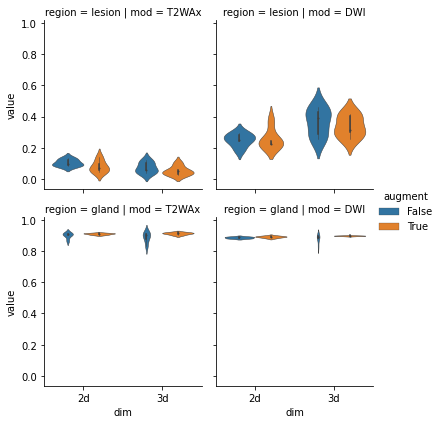

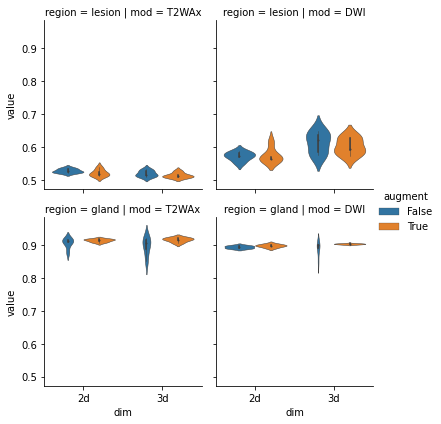

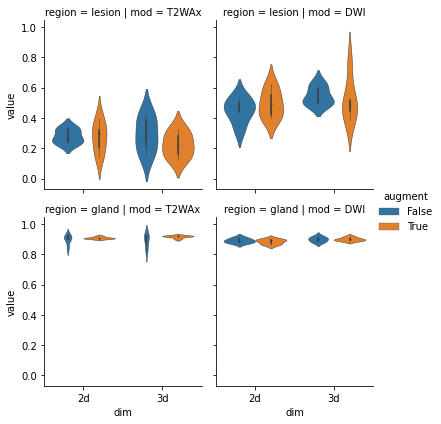

In [2]:
for m in ['f1-score', 'iou', 'prec']:
    plt.rcParams['figure.figsize'] = (2,2)
    sb.catplot(
        x="dim",y="value",hue="augment",col="mod",row="region",
        data=metric_df[metric_df["metric"]==m],height=3,aspect=0.9,kind="violin",
        order=["2d","3d"],linewidth=0.5)

### External validation scores (only for gland)

In [4]:
metric_dict_test = {
    "mod":[],"region":[],"augment":[],"dim":[],
    "metric":[],"fold":[],"value":[]}
for metric_path in glob("metrics_test/u-net-*/*csv"):
    info = metric_path.split(os.sep)
    dim = info[-2].split('-')[-1]
    mod = info[-1].split('.')[0]
    region = info[-1].split('.')[1]
    augment = 'augment' in info[-1]
    with open(metric_path,'r') as o:
        for l in o:
            l = l.strip()
            metric,fold,task,value = l.split(',')
            if metric not in ['train_ids','val_ids'] and region != "gland_lesion":
                metric_dict_test["mod"].append(mod)
                metric_dict_test["region"].append(region)
                metric_dict_test["augment"].append(augment)
                metric_dict_test["dim"].append(dim)
                metric_dict_test["metric"].append(metric)
                metric_dict_test["fold"].append(int(fold))
                metric_dict_test["value"].append(float(value))

metric_df_test = pd.DataFrame.from_dict(metric_dict_test)
metric_df_test["eval_type"] = "External validation"

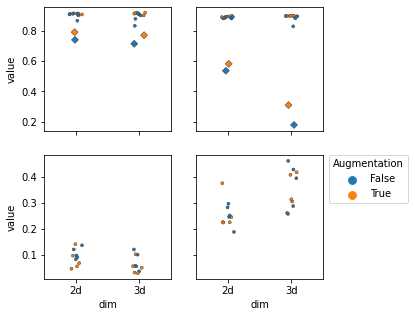

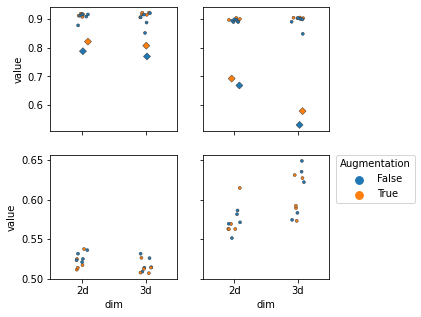

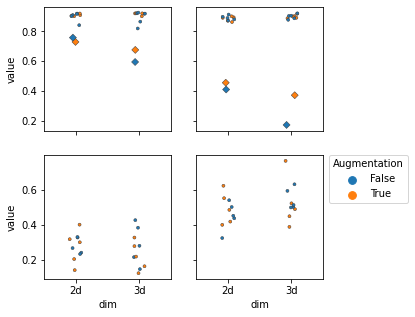

In [5]:
metric_df_all = pd.concat([metric_df,metric_df_test])


for m in ['f1-score', 'iou', 'prec']:
    plt.rcParams['figure.figsize'] = (5,5)

    fig, axes = plt.subplots(2,2,sharex="all",sharey="row")
    sub_df = metric_df_all[metric_df_all["metric"]==m]
    rs = ["gland","lesion"]
    ms = ["T2WAx","DWI"]
    for i,j in product([0,1],[0,1]):
        r = rs[i]
        m = ms[j]
        subsub_df = sub_df[(sub_df["mod"]==m) * (sub_df["region"]==r)]
        g = sb.stripplot(x="dim",y="value",hue="augment",
            data=subsub_df[subsub_df["eval_type"] == "CV"],size = 3,
            order=["2d","3d"],linewidth=0.5,ax=axes[i,j])
        if i == 0: g.set(xlabel=None)
        if j == 1: g.set(ylabel=None)
        sub_external = subsub_df[subsub_df["eval_type"] == "External validation"]
        if sub_external.size > 0:
            g = sb.stripplot(x="dim",y="value",hue="augment",
                data=sub_external,size=5,marker="D",
                order=["2d","3d"],linewidth=0.5,ax=axes[i,j])
            if i == 0: g.set(xlabel=None)
            if j == 1: g.set(ylabel=None)
        g._axes.get_legend().remove()

    l = plt.legend(
        title="Augmentation",bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

## Visualizing predictions

### Cross-validation and lesion detection

Below is the cross-validation, the lesion detection is after this.

In [7]:
B = '/home/jose_almeida/data/PROSTATEx/ProstateX_resized/aggregated-labels-{}/{}_{}_aggregated.nii.gz'

def get_info(path):
    with open(path,'r') as o:
        x = o.read().strip().split(',')
    x = np.array([float(y) for y in x])
    return x

def rescale_image(image):
    m = image.min()
    M = image.max()
    image = (image-m)/(M-m)
    image = np.uint8(image*255)
    return image

spacing_dict = {
    "T2WAx":get_info('dataset_information/spacing.T2WAx'),
    "DWI":get_info('dataset_information/spacing.DWI')}

size_dict = {
    "T2WAx":get_info('dataset_information/size.T2WAx'),
    "DWI":get_info('dataset_information/size.DWI')}

transforms_dwi = monai.transforms.Compose([
    monai.transforms.LoadImaged(["image"]),
    monai.transforms.AddChanneld(["image"]),
    monai.transforms.Resized(
        ["image"],tuple(np.int32(size_dict["DWI"])),mode="nearest")])

transforms_t2wax = monai.transforms.Compose([
    monai.transforms.LoadImaged(["image"]),
    monai.transforms.AddChanneld(["image"]),
    monai.transforms.Resized(
        ["image"],tuple(np.int32(size_dict["T2WAx"])),mode="nearest")])

transforms_t2wax3d = monai.transforms.Compose([
    monai.transforms.LoadImaged(["image"]),
    monai.transforms.AddChanneld(["image"]),
    monai.transforms.Resized(
        ["image"],tuple(np.int32(size_dict["T2WAx"]*[0.5,0.5,1])),mode="nearest")])

T2WAx 3d gland


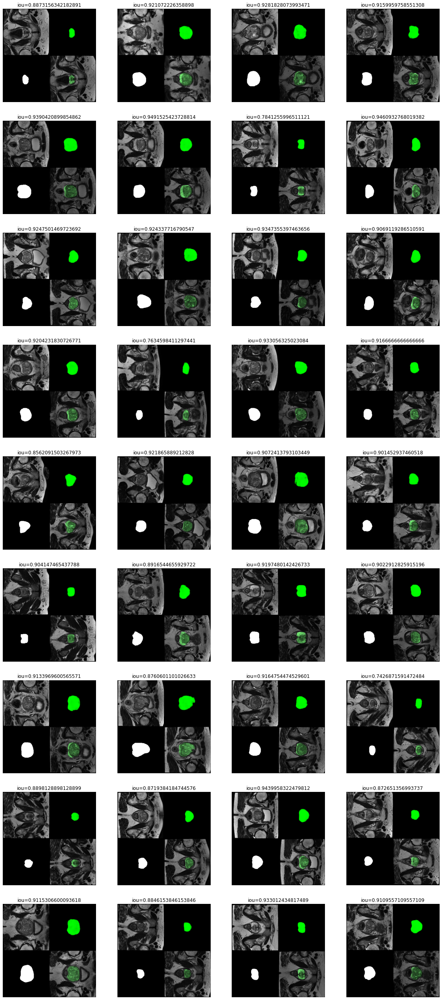

T2WAx 2d gland


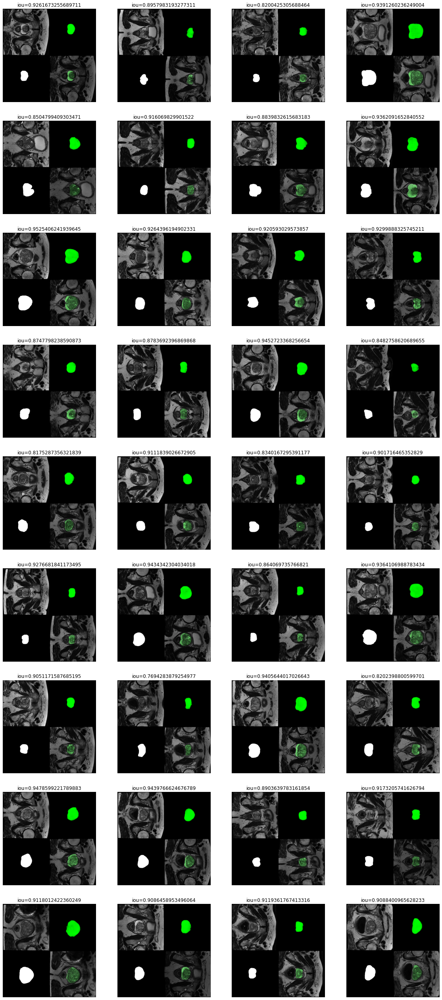

DWI 2d gland


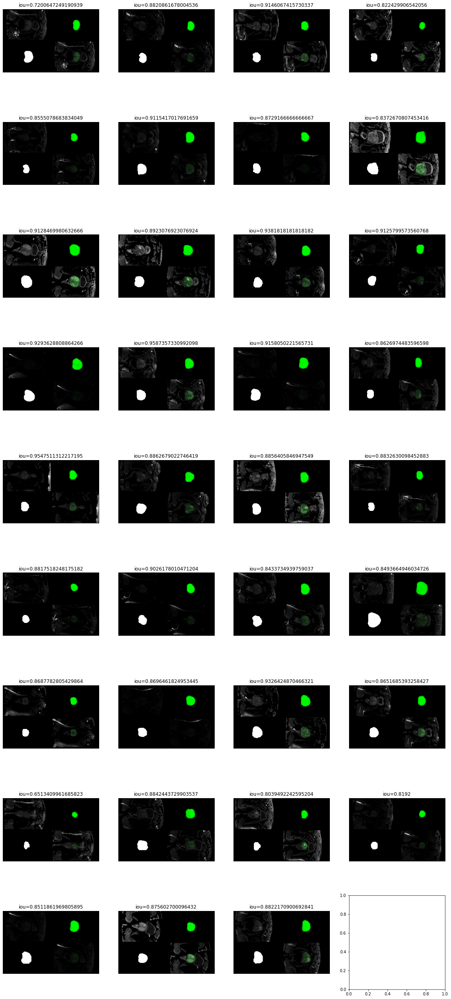

DWI 3d gland


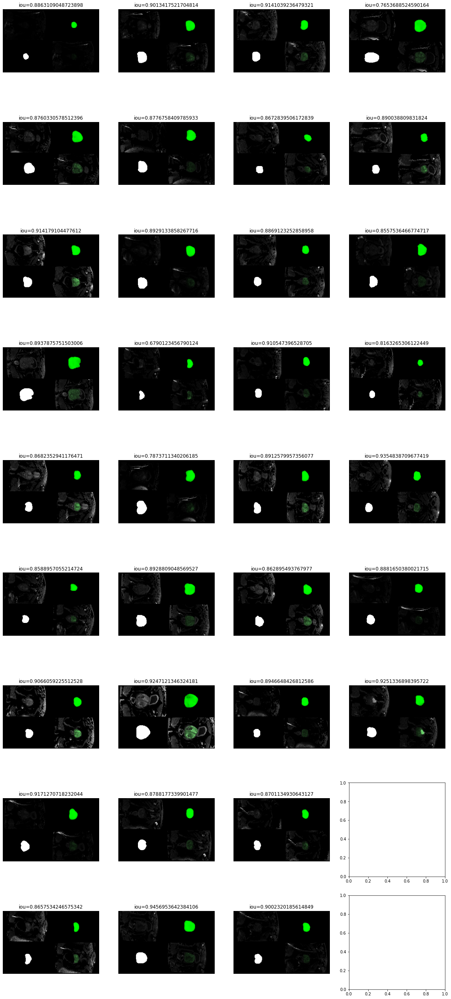

DWI 2d lesion


invalid value encountered in true_divide


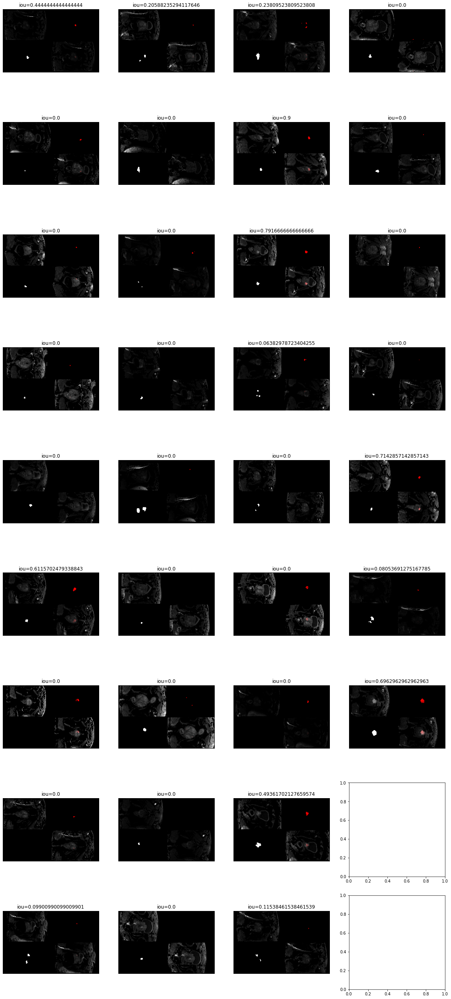

DWI 3d lesion


invalid value encountered in true_divide


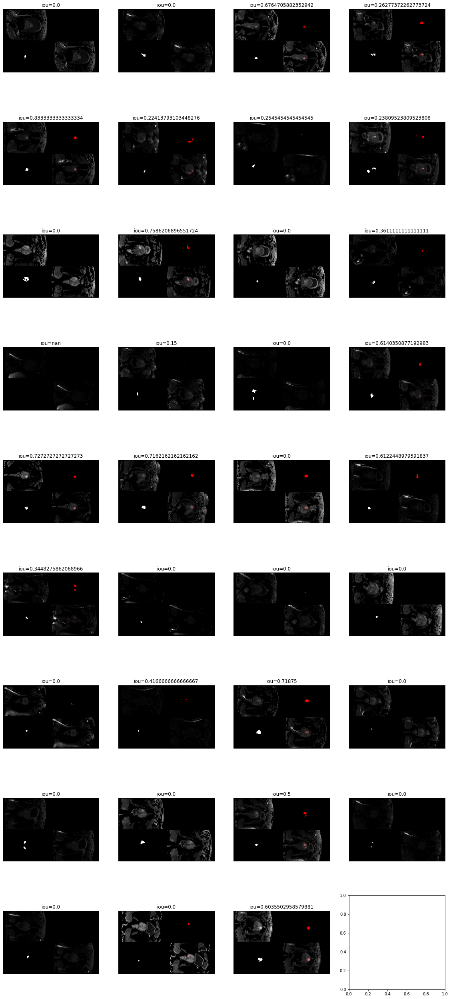

T2WAx 2d lesion


KeyboardInterrupt: 

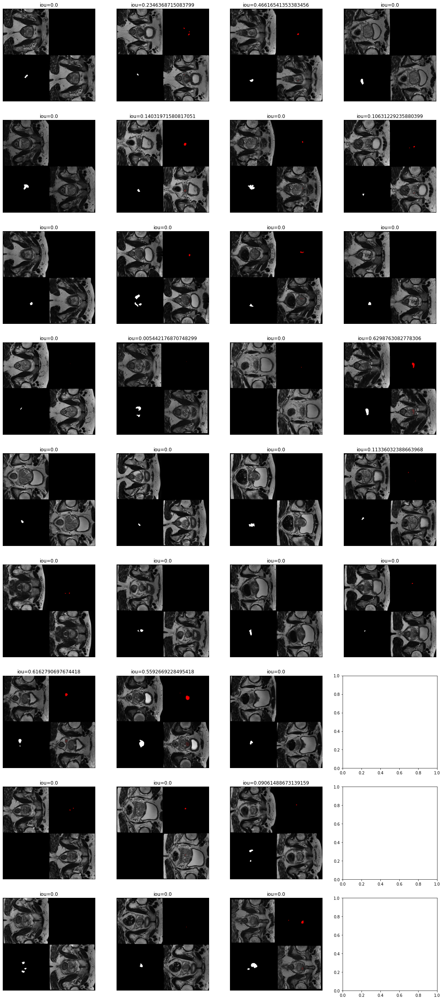

In [59]:
m = 4
plt.rcParams['figure.figsize'] = (4*m,9*m)

for prediction_folder_path in glob("predictions/prostate-x/*"):
    folder_name = prediction_folder_path.split(os.sep)[-1].split('.')
    mod = folder_name[0]
    region = folder_name[1]
    dim = folder_name[2]
    augment = 'augment' in folder_name
    if augment == True:
        all_pred_paths = glob(
            os.path.join(prediction_folder_path,"*"))
        fig,ax = plt.subplots(9,4)
        fig.subplots_adjust(right=0.98,left=0.02,top=0.98,bottom=0.02)
        print(mod,dim,region)
        for i in range(len(all_pred_paths)):
            prediction_path = all_pred_paths[i]
            ci,cj = i % 9,i // 9
            x = np.load(prediction_path,allow_pickle=True)
            image_path,image,pred = x
            image_id = image_path.split(os.sep)[-1].split('_')[0]
            label_path = B.format(region,image_id,mod)
            if mod == "DWI":
                label_image = transforms_dwi({"image":label_path})
            elif mod == "T2WAx":
                if dim == "2d":
                    label_image = transforms_t2wax({"image":label_path})
                else:
                    label_image = transforms_t2wax3d({"image":label_path})
            label_image = label_image['image'][0]
            image = np.squeeze(image)
            if dim == "2d":
                image = np.expand_dims(image,-1).swapaxes(0,-1).squeeze()
            pred = np.squeeze(pred)
            if region == 'lesion':
                slice_idx = np.argmax((label_image+pred).sum(0).sum(0))
            else:
                slice_idx = 8
            image_display = image[:,:,slice_idx]
            image_display = np.stack([image_display for _ in range(3)],-1)
            pred_disp = pred[:,:,slice_idx]
            label_disp = label_image[:,:,slice_idx]
            intersection = np.sum(((pred_disp>0.5)==label_disp)*(label_disp==1))
            union = np.sum(pred_disp>0.5)+np.sum(label_disp)-intersection
            if region == "gland":
                pred_disp = np.stack(
                    [np.zeros_like(pred_disp),pred_disp,np.zeros_like(pred_disp)],-1)
            else:
                pred_disp = np.stack(
                    [pred_disp,np.ones_like(pred_disp)*0.5,np.ones_like(pred_disp)*0.5],-1)
            ann_image_display = np.where(
                pred_disp>0.5,
                image_display*pred_disp,
                image_display*0.5)
            
            label_disp = np.int32(
                np.stack([label_disp>0 for _ in range(3)],-1))
            left = np.concatenate(
                [rescale_image(image_display),
                 rescale_image(label_disp)])
            right = np.concatenate(
                [rescale_image(np.where(pred_disp>0.5,pred_disp,0)),
                 rescale_image(ann_image_display)])
            compound_image = np.concatenate([left,right],axis=1)
            
            ax[ci,cj].imshow(compound_image)
            ax[ci,cj]._axes.set_axis_off()
            ax[ci,cj].title.set_text("iou={:.3f}".format(intersection/union))
        plt.show()

#### Lesion detection - practical considerations and implementation

Considering that U-Net only outputs predictions at a per-pixel level, the assessment of lesion detection becomes trickier as it requires some level of arbitrary definition of thresholds regarding overlaps. For this reason, I define a true positive as a predicted connected region with a high enough degree of overlap with a ground truth connected region. For this we require to define an arbitrary IoU limit. Below I will try a few different IoU levels to determine the best one for this application.

In [50]:
from skimage import measure

iou_df = {"prostate_x_id":[],"mod":[],"dim":[],
          "pred_idx":[],"gt_idx":[],
          "pred_size":[],"gt_size":[],
          "intersection":[]}
prob_thresh = 0.5

for prediction_folder_path in glob("predictions/prostate-x/*lesion*"):
    folder_name = prediction_folder_path.split(os.sep)[-1].split('.')
    mod = folder_name[0]
    region = folder_name[1]
    dim = folder_name[2]
    augment = 'augment' in folder_name
    if augment == True:
        all_pred_paths = glob(
            os.path.join(prediction_folder_path,"*"))
        print(mod,dim,region)
        for i in range(len(all_pred_paths)):
            prediction_path = all_pred_paths[i]
            ci,cj = i % 9,i // 9
            x = np.load(prediction_path,allow_pickle=True)
            image_path,image,pred = x
            image_id = image_path.split(os.sep)[-1].split('_')[0]
            label_path = B.format(region,image_id,mod)
            if mod == "DWI":
                label_image = transforms_dwi({"image":label_path})
            elif mod == "T2WAx":
                if dim == "2d":
                    label_image = transforms_t2wax({"image":label_path})
                else:
                    label_image = transforms_t2wax3d({"image":label_path})
            label_image = label_image['image'][0]
            image = np.squeeze(image)
            if dim == "2d":
                image = np.expand_dims(image,-1).swapaxes(0,-1).squeeze()
            pred = np.squeeze(pred)
            if region == 'lesion':
                slice_idx = np.argmax((label_image+pred).sum(0).sum(0))
            else:
                slice_idx = 8
        
            components_pr = measure.label(np.round(pred>prob_thresh).astype(np.int32))
            components_gt = measure.label(np.round(label_image).astype(np.int32))
            
            u_pr = np.unique(components_pr)
            u_pr = u_pr[u_pr != 0]
            u_gt = np.unique(components_gt)
            u_gt = u_gt[u_gt != 0]
            
            for prc,gtc in product(u_pr,u_gt):
                sub_pr = np.where(components_pr == prc,1,0)
                sub_gt = np.where(components_gt == gtc,1,-1)
                s_pr = np.sum(sub_pr==1)
                s_gt = np.sum(sub_gt==1)
                intersection = np.sum(sub_pr == sub_gt)
                iou_df["prostate_x_id"].append(image_id)
                iou_df["mod"].append(mod)
                iou_df["dim"].append(dim)
                iou_df["pred_idx"].append(prc)
                iou_df["gt_idx"].append(gtc)
                iou_df["pred_size"].append(s_pr)
                iou_df["gt_size"].append(s_gt)
                iou_df["intersection"].append(intersection)

DWI 2d lesion
DWI 3d lesion
T2WAx 2d lesion
T2WAx 3d lesion


In [57]:
threshold = 0.25

iou = pd.DataFrame.from_dict(iou_df)
iou_sum = iou.groupby(["prostate_x_id","mod","dim","gt_idx","gt_size"]).aggregate(
    {'pred_size':'sum','intersection':'sum'}).reset_index()

iou_sum["union"] = iou_sum["pred_size"] + iou_sum["gt_size"] - iou_sum["intersection"]
iou_sum["iou"] = iou_sum["intersection"]/iou_sum["union"]
iou_sum["detected"] = iou_sum["iou"] > threshold

iou_sum.groupby(["mod","dim"]).aggregate(
    {'detected':'mean'}).reset_index()

,mod,dim,detected
0,DWI,2d,0.156863
1,DWI,3d,0.325000
2,T2WAx,2d,0.017544
3,T2WAx,3d,0.023256


### External validation set

In [1]:
B = '/home/jose_almeida/data/Task05_Prostate/labelsTr/{}.nii.gz'

T2WAx 3d gland


invalid value encountered in true_divide


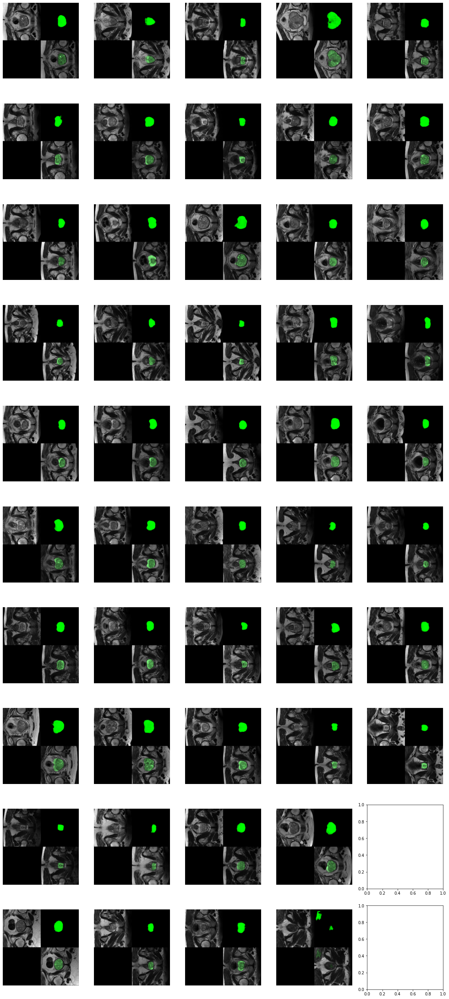

T2WAx 2d gland


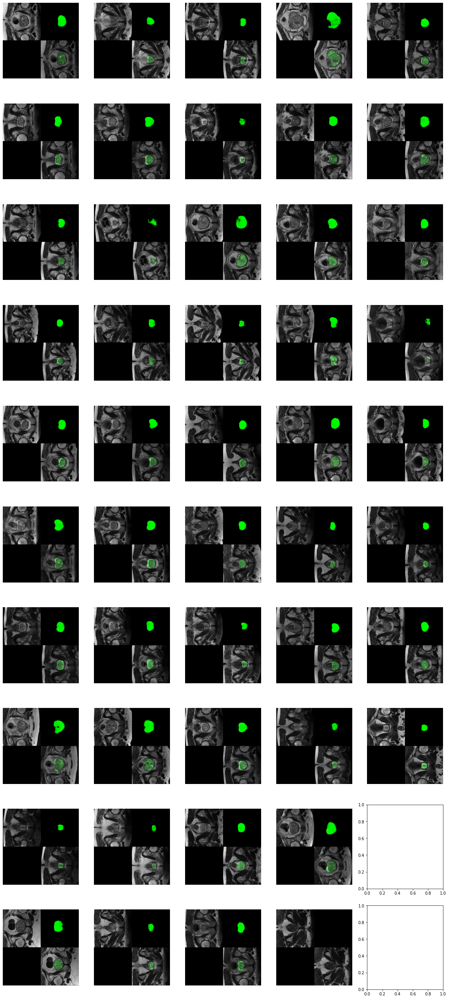

DWI 2d gland


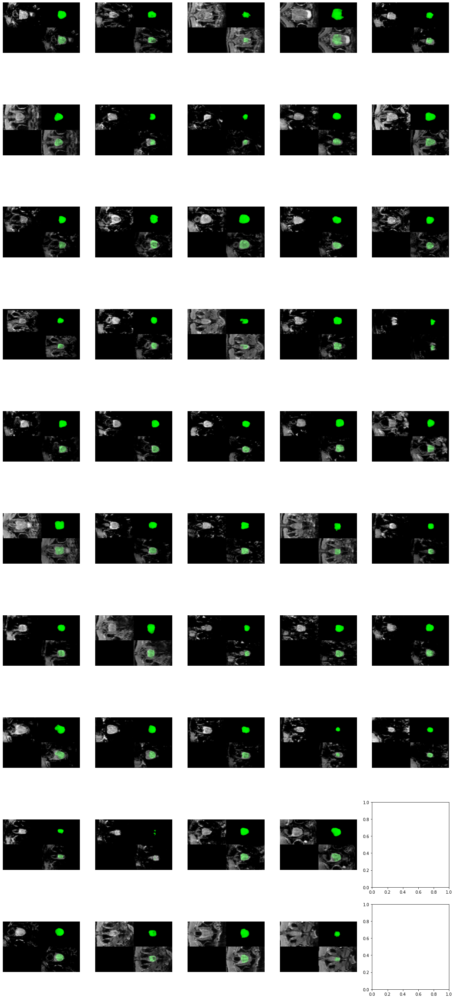

DWI 3d gland


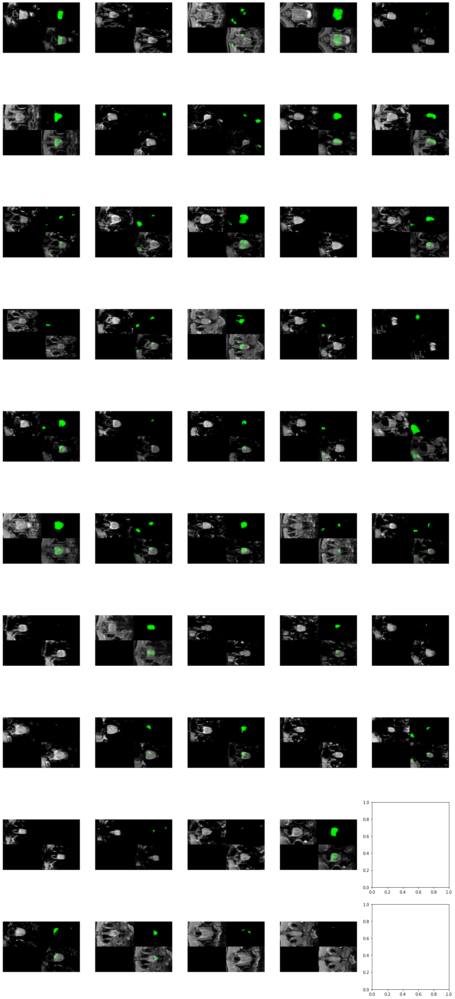

DWI 2d lesion


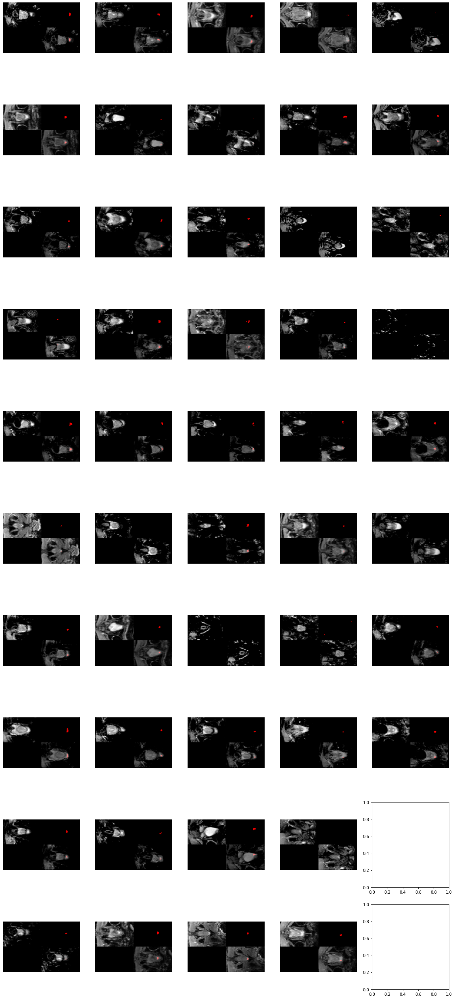

DWI 3d lesion


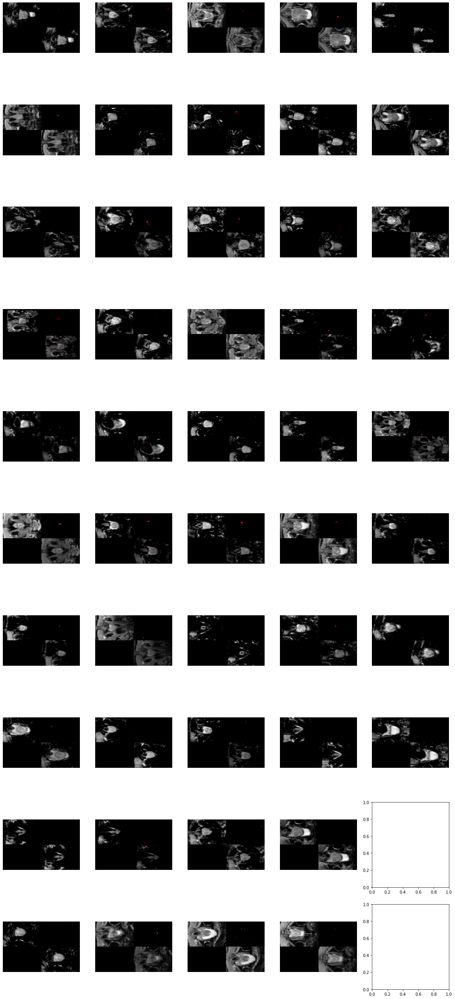

T2WAx 2d lesion


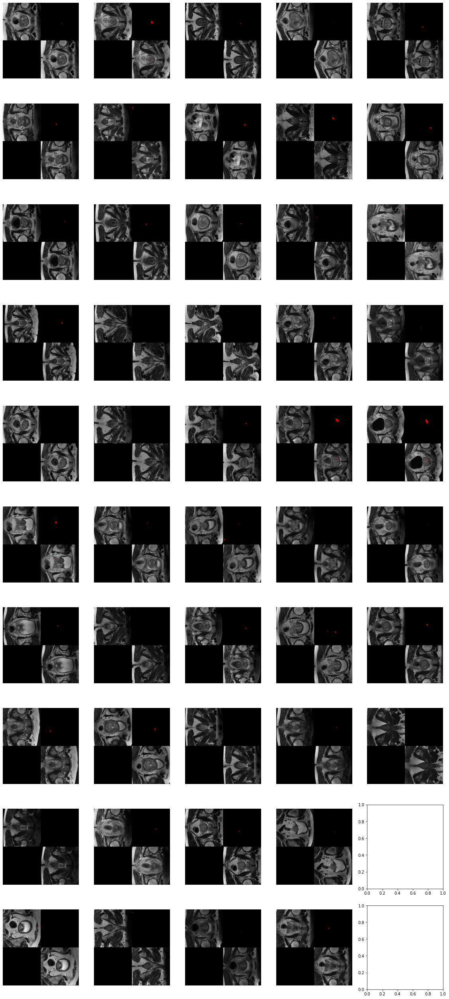

T2WAx 3d lesion


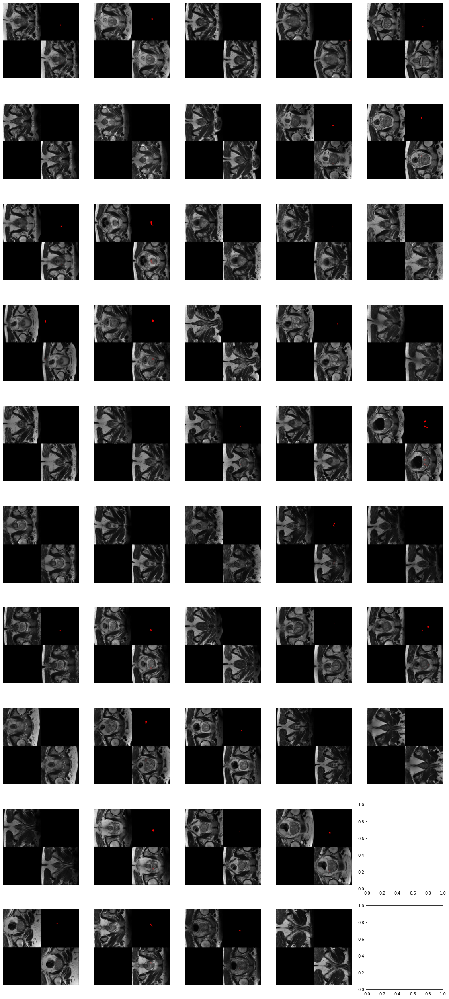

In [12]:
m = 1
plt.rcParams['figure.figsize'] = (5*m,10*m)

def rescale_image(image):
    m = image.min()
    M = image.max()
    image = (image-m)/(M-m)
    image = np.uint8(image*255)
    return image

for prediction_folder_path in glob("predictions/decathlon/*"):
    folder_name = prediction_folder_path.split(os.sep)[-1].split('.')
    mod = folder_name[0]
    region = folder_name[1]
    dim = folder_name[2]
    augment = 'augment' in folder_name
    if augment == True:
        all_pred_paths = glob(
            os.path.join(prediction_folder_path,"*"))
        fig,ax = plt.subplots(10,5)
        fig.subplots_adjust(right=0.98,left=0.02,top=0.98,bottom=0.02)
        print(mod,dim,region)
        for i in range(len(all_pred_paths)):
            prediction_path = all_pred_paths[i]
            ci,cj = i % 10,i // 10
            x = np.load(prediction_path,allow_pickle=True)
            image_path,image,pred = x
            image_id = image_path.split(os.sep)[-1].split('_')[0]
            label_path = B.format(region,image_id,mod)
            print(label_path)
            if os.path.isfile(label_path):
                if mod == "DWI":
                    label_image = transforms_dwi({"image":label_path})
                elif mod == "T2WAx":
                    if dim == "2d":
                        label_image = transforms_t2wax({"image":label_path})
                    else:
                        label_image = transforms_t2wax3d({"image":label_path})
            else:
                label_image = {'image':np.zeros_like(pred)}
            label_image = np.squeeze(label_image['image'])
            image = np.squeeze(image)
            if dim == "2d":
                image = np.expand_dims(image,-1).swapaxes(0,-1).squeeze()
            pred = np.squeeze(pred)
            if region == 'lesion':
                slice_idx = np.argmax((label_image+pred).sum(0).sum(0))
            else:
                slice_idx = 8
            image_display = image[:,:,slice_idx]
            image_display = np.stack([image_display for _ in range(3)],-1)
            pred_disp = pred[:,:,slice_idx]
            label_disp = label_image[:,:,slice_idx]
            if region == "gland":
                pred_disp = np.stack(
                    [np.zeros_like(pred_disp),pred_disp,np.zeros_like(pred_disp)],-1)
            else:
                pred_disp = np.stack(
                    [pred_disp,np.ones_like(pred_disp)*0.5,np.ones_like(pred_disp)*0.5],-1)
            ann_image_display = np.where(
                pred_disp>0.5,
                image_display*pred_disp,
                image_display*0.5)
            
            label_disp = np.int32(
                np.stack([label_disp>0 for _ in range(3)],-1))
            left = np.concatenate(
                [rescale_image(image_display),
                 rescale_image(label_disp)])
            right = np.concatenate(
                [rescale_image(np.where(pred_disp>0.5,pred_disp,0)),
                 rescale_image(ann_image_display)])
            compound_image = np.concatenate([left,right],axis=1)
            ax[ci,cj].imshow(compound_image)
            ax[ci,cj]._axes.set_axis_off()
        plt.show()